In [1]:
import h5py
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import boost_histogram as bh
import simweights
import scipy as scp
f1=h5py.File('/net/big-tank/POOL/users/lwitthaus/prompt_muons/data/dnn_manyV3/30010/level2/00000-00999/Corsika_30010_level2_00000000.hdf5','r')
f2=h5py.File('/net/big-tank/POOL/projects/icecube/prompt_muons/evaluated_cleaned/dnn_cleaned/Corsika/30010/level2/00000-00999/Corsika_30010_level2_00000000.hdf5','r')
files=glob.glob('/net/big-tank/POOL/users/lwitthaus/prompt_muons/data/dnn_manyV3/3001*/level2/00000-00999/*')
files2=glob.glob('/net/big-tank/POOL/projects/icecube/prompt_muons/evaluated_dnn_manyV2/dnn_manyV2/Corsika/3001*/level2/00000-00999/*')
files3=glob.glob('/net/big-tank/POOL/projects/icecube/prompt_muons/evaluated_cleaned/dnn_cleaned/Corsika/3001*/level2/00000-00999/*')

In [2]:
f1['MCLabelsLeadingMuons'][:]

array([(300100000,   10, 0, 0, 1, 4.54798373,  0.04996605,  0.3011769 , -0.9522583 , 925685.1875   ,  0.93827201, 2.21200000e+03, 0.31024664,  2049.28913667,  5211.17750193,  4787.66693443, 13152.38469374,  2648.35460407, 11394.01849143,  370.56647626,  -96.58790372, -1.11264270e+01,  3351.42294905,  8903.11855926,  333.31481251, -321.42469177,  700.        , 0.12498591, 0.12271795, 0.0818409 , 0.66460612, 0.70001172, 0.33617022,  4421.44000549,  1076.40304812, nan, nan, nan, 1., 13., 10.,  8.,  6., 18., 0., 1., 0., 0., 0., 0., 0., 1., 1., 1.),
       (300100000,   20, 0, 0, 1, 2.89475049,  0.52898649, -0.13329449, -0.83809658, 997357.875    ,  0.93827201, 2.21200000e+03, 0.57701169, 11059.32493262, 23738.80254666, 20195.92243915, 43063.25360535, 10439.65938559, 11414.08777202, -293.18134758,  -88.35740133, -1.71001496e+02, 15001.31569218,  8866.85020931, -697.15195576,   13.46934345,  468.98998678, 0.09765252, 0.10975013, 0.07650841, 0.74672627, 0.74278933, 0.5444521 , 23445.87867816,

In [3]:
for key in f2.keys():
    print(key)

CorsikaWeightMap
DeepLearningReco_direction_cleaned_pulses
DeepLearningReco_direction_cleaned_pulses_I3Particle
DeepLearningReco_direction_smaller_conv_cleaned_pulses
DeepLearningReco_direction_smaller_conv_cleaned_pulses_I3Particle
DeepLearningReco_energy_smaller_model_cleaned
DeepLearningReco_energy_smaller_model_cleaned_I3Particle
FilterMask
HitStatistics_SplitInIceDSTPulses
I3EventHeader
MCLabelsLeadingMuons
MCLabelsMostEnergeticMuonParentInfo
MCPrimary
MPEFit
MPEFitCharacteristics
MPEFitFitParams
MPEFitMuEX
MostEnergeticMuonInside
PolyplopiaPrimary
QFilterMask
SPEFit2
__I3Index__
dnn_data_bin_indices
dnn_data_bin_values
dnn_data_global_time_offset
weights
weights_meta_info


In [4]:
def add_simweights(df: pd.DataFrame, model_class: list[simweights._fluxes.CosmicRayFlux] | simweights._fluxes.CosmicRayFlux):
    """ Adds weights for all primary models in model_class (from simweights._fluxes) to the df.
        The key will be "simweights_{name of model_class}" for each model. 
    """
    
    if not isinstance(model_class, list):
        model_class = [model_class]
    

    for primary_model in model_class:   
        df['simweights_'+primary_model.__name__] = np.empty(len(df))

    weight_keys = [
        "CylinderLength",
        "CylinderRadius",
        "EnergyPrimaryMax",
        "EnergyPrimaryMin",
        "NEvents",
        "OverSampling",
        "ParticleType",
        "PrimaryEnergy",
        "PrimarySpectralIndex",
        "PrimaryType",
        "ThetaMax",
        "ThetaMin",
        "Weight",
    ]

    # loop through different files
    e_low = np.unique(df.EnergyPrimaryMin)

    for e_l in e_low:
        mask = df.EnergyPrimaryMin == e_l
        print(f'minimum primary energy: {e_l} GeV')
        number_corsika_files = len(np.unique(df.Run[mask]))
        print('number of processed files: ', number_corsika_files)

        CorsikaWeightMap: dict = {k: [df[k][mask]] for k in weight_keys}
        PolyplopiaPrimary: dict = {k: [df[k][mask]] for k in ["type", "energy", "zenith"]}


        fobj = {"CorsikaWeightMap": CorsikaWeightMap, "PolyplopiaPrimary": PolyplopiaPrimary}
        wobj = simweights.CorsikaWeighter(fobj, nfiles=number_corsika_files)

        for primary_model in model_class:   
            df.loc[mask, 'simweights_'+primary_model.__name__] = wobj.get_weights(primary_model())

In [5]:
CorsikaWeightMap=pd.DataFrame([])
for file in files:
    df_poly=pd.read_hdf(file,key='PolyplopiaPrimary')
    df_poly=pd.concat([df_poly,pd.read_hdf(file,key='CorsikaWeightMap')],axis=1)
    CorsikaWeightMap=pd.concat([CorsikaWeightMap,df_poly])

In [6]:
CorsikaWeightMap_c=pd.DataFrame([])
for file in files3:
    df_poly=pd.read_hdf(file,key='PolyplopiaPrimary')
    df_poly=pd.concat([df_poly,pd.read_hdf(file,key='CorsikaWeightMap')],axis=1)
    CorsikaWeightMap_c=pd.concat([CorsikaWeightMap_c,df_poly])

In [7]:
df_DNN_energy_cleaned=pd.DataFrame([])
df_MCLabelsLeading_c=pd.DataFrame([])
df_MCLabelsParent_c=pd.DataFrame([])
for file in files3:
    df_DNN_energy_cleaned=pd.concat([df_DNN_energy_cleaned,pd.read_hdf(file,key='DeepLearningReco_energy_smaller_model_cleaned')])
    df_MCLabelsLeading_c=pd.concat([df_MCLabelsLeading_c,pd.read_hdf(file,key='MCLabelsLeadingMuons')])
    df_MCLabelsParent_c=pd.concat([df_MCLabelsParent_c,pd.read_hdf(file,key='MCLabelsMostEnergeticMuonParentInfo')])

/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.50_entry'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.50_mctree'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.90_entry'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use nat

In [8]:
df_MCLabelsLeading=pd.DataFrame([])
df_MCLabelsParent=pd.DataFrame([])
df_DNN_energy_s_cleaned=pd.DataFrame([])
df_DNN_energy_bigger_max_bias=pd.DataFrame([])
df_DNN_energy_leading=pd.DataFrame([])
for file in files:
    df_MCLabelsLeading=pd.concat([df_MCLabelsLeading,pd.read_hdf(file,key='MCLabelsLeadingMuons')])
    df_MCLabelsParent=pd.concat([df_MCLabelsParent,pd.read_hdf(file,key='MCLabelsMostEnergeticMuonParentInfo')])
    df_DNN_energy_s_cleaned=pd.concat([df_DNN_energy_s_cleaned,pd.read_hdf(file,key='DeepLearningReco_energy_smaller_model_cleaned')])
    df_DNN_energy_bigger_max_bias=pd.concat([df_DNN_energy_bigger_max_bias,pd.read_hdf(file,key='DeepLearningReco_energy_bigger_convolutional_max_biasV2')])
    df_DNN_energy_leading=pd.concat([df_DNN_energy_leading,pd.read_hdf(file,key='DeepLearningReco_leading_energy')])

/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.50_entry'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.50_mctree'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.90_entry'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use nat

In [9]:
df_DNN_energy_bigger_max=pd.DataFrame([])
df_MCLabelsLeading2=pd.DataFrame([])
for file in files2:
    df_DNN_energy_bigger_max=pd.concat([df_DNN_energy_bigger_max,pd.read_hdf(file,key='DeepLearningReco_energy_bigger_convolutional_max')])
    df_MCLabelsLeading2=pd.concat([df_MCLabelsLeading2,pd.read_hdf(file,key='MCLabelsLeadingMuons')])

/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.50_entry'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.50_mctree'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use natural naming to access this object; using ``getattr()`` will still work, though
  check_attribute_name(name)
/scratch/lflottau/lf/lib/python3.10/site-packages/tables/path.py:137: NaturalNameWarning: object name is not a valid Python identifier: 'p_is_leading_muon_fr0.90_entry'; it does not match the pattern ``^[a-zA-Z_][a-zA-Z0-9_]*$``; you will not be able to use nat

In [10]:
def nansem(a):
    return scp.stats.sem(a, nan_policy='omit')
def mid(b):
    return 10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)

In [11]:
def cut(mask,df_DNN,entry,bundle):
    pred_cut=df_DNN[mask]
    true_cut=df_MCLabelsLeading[mask]
    weights_cut=CorsikaWeightMap[mask]
    Parent_cut=df_MCLabelsParent[mask]
    pred_high_entry=Parent_cut[pred_cut.entry_energy>=10**5]
    pred_high_bundle=Parent_cut[pred_cut.bundle_energy_at_entry>=10**5]
    high_entry=df_MCLabelsParent[df_DNN.entry_energy>=10**5]
    high_bundle=df_MCLabelsParent[df_DNN.bundle_energy_at_entry>=10**5]
    print('fraction total cut:', np.size(pred_cut.entry_energy)/np.size(df_DNN.entry_energy))
    print('fraction prompt cut:', np.size(pred_cut.entry_energy[Parent_cut.is_prompt_dennis==1])/np.size(df_DNN.entry_energy[df_MCLabelsParent.is_prompt_dennis==1]))
    if entry==1:
        print('fraction entry prompt over 10**5:', np.size(pred_high_entry.is_prompt_dennis[pred_high_entry.is_prompt_dennis==1])/np.size(high_entry.is_prompt_dennis[high_entry.is_prompt_dennis==1]))
    if bundle==1:
        print('fraction bundle prompt over 10**5:', np.size(pred_high_bundle.is_prompt_dennis[pred_high_bundle.is_prompt_dennis==1])/np.size(high_bundle.is_prompt_dennis[high_bundle.is_prompt_dennis==1]))    
    return pred_cut,true_cut,weights_cut,Parent_cut

In [12]:
def correlation_plot(pred: pd.DataFrame,true: pd.DataFrame,min1,max1,type1):
    bins=np.logspace(min1,max1,100)
    if type1==1:
        plt.hist2d(pred.bundle_energy_at_entry,true.bundle_energy_at_entry,bins=bins,norm='log')
        plt.xlabel('predicted bundle energy at entry [GeV]')
        plt.ylabel('true bundle energy at entry [GeV]')
    if type1==0:
        plt.hist2d(pred.entry_energy,true.entry_energy,bins=bins,norm='log')
        plt.xlabel('predicted entry energy [GeV]')
        plt.ylabel('true entry energy [GeV]')
    plt.yscale('log')
    plt.xscale('log')
    plt.xlim([10**min1,10**max1])
    plt.ylim([10**min1,10**max1])
    plt.colorbar(label='Number of Events')
    plt.plot(bins,bins)
    plt.legend()
def correlation_plot_weighted(pred: pd.DataFrame,true: pd.DataFrame,weights,min1,max1,type1):
    bins=np.logspace(min1,max1,100)
    if type1==1:
        plt.hist2d(pred.bundle_energy_at_entry,true.bundle_energy_at_entry,weights=weights,bins=bins_bundle,norm='log')
        plt.xlabel('predicted bundle energy at entry')
        plt.ylabel('true bundle energy at entry')
    if type1==0:
        plt.hist2d(pred.entry_energy,true.entry_energy,weights=weights,bins=bins,norm='log')
        plt.xlabel('predicted entry energy')
        plt.ylabel('true entry energy')
    plt.yscale('log')
    plt.xscale('log')
    plt.xlim([10**min1,10**max1])
    plt.ylim([10**min1,10**max1])
    plt.colorbar()
    plt.plot(bins,bins)

In [13]:
def add_mean_error_entry(pred: pd.DataFrame, true:pd.DataFrame, bins, step):
    sem, bins1, digitized=scp.stats.binned_statistic(pred.entry_energy,true.entry_energy,bins=bins,statistic=nansem)
    mean, bins1, digitized=scp.stats.binned_statistic(pred.entry_energy,true.entry_energy,bins=bins,statistic=np.nanmean)
    plt.errorbar(mid(bins)[::step],mean[::step],sem[::step],fmt='x',label='mean')
    plt.legend()
def add_mean_error_bundle(pred: pd.DataFrame, true:pd.DataFrame, bins, step):
    sem, bins1, digitized=scp.stats.binned_statistic(pred.bundle_energy_at_entry,true.bundle_energy_at_entry,bins=bins,statistic=nansem)
    mean, bins1, digitized=scp.stats.binned_statistic(pred.bundle_energy_at_entry,true.bundle_energy_at_entry,bins=bins,statistic=np.nanmean)
    plt.errorbar(mid(bins)[::step],mean[::step],sem[::step],fmt='x',label='mean') 
    plt.legend()

In [14]:
def prompt_conventional_flux_entry(b,energy: pd.DataFrame, Parent: pd.DataFrame, weights):
    plt.hist(energy.entry_energy[Parent.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=weights[Parent.is_prompt_dennis==0],color='blue')
    plt.hist(energy.entry_energy[Parent.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt', weights=weights[Parent.is_prompt_dennis==1],color='orange')
    plt.xscale('log')
    plt.yscale('log')
    plt.xlim([np.min(b),np.max(b)])
    plt.xlabel('entry energy leading[GeV]')
    plt.ylabel('event rate[1/s]')
    plt.legend()
    errors_conventional, error_edges_conventional=bh.numpy.histogram(energy.entry_energy[Parent.is_prompt_dennis==0],bins=b,weights=weights[Parent.is_prompt_dennis==0]**2)
    errors_prompt, errors_edges_prompt=bh.numpy.histogram(energy.entry_energy[Parent.is_prompt_dennis==1],bins=b,weights=weights[Parent.is_prompt_dennis==1]**2)
    conventional_weighted, bins_conv=bh.numpy.histogram(energy.entry_energy[Parent.is_prompt_dennis==0],bins=b, weights=weights[Parent.is_prompt_dennis==0])
    prompt_weighted, bins_prompt=bh.numpy.histogram(energy.entry_energy[Parent.is_prompt_dennis==1],bins=b, weights=weights[Parent.is_prompt_dennis==1])
    mid=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
    plt.errorbar(mid,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x',color='blue')
    plt.errorbar(mid,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x',color='orange')
    #plt.step(b[:np.size(b)-1],conventional_weighted,where='post',label='conventional')
    #plt.step(b[:np.size(b)-1], prompt_weighted, where='post', label='prompt')
def prompt_conventional_flux_bundle(b,energy: pd.DataFrame, Parent: pd.DataFrame, weights):
    plt.hist(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=weights[Parent.is_prompt_dennis==0],color='blue')
    plt.hist(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt', weights=weights[Parent.is_prompt_dennis==1],color='orange')
    plt.xscale('log')
    plt.xlim([np.min(b),np.max(b)])
    plt.xlabel('bundle energy [GeV]')
    plt.ylabel('event rate[1/s]')
    plt.legend()
    errors_conventional, error_edges_conventional=bh.numpy.histogram(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==0],bins=b,weights=weights[Parent.is_prompt_dennis==0]**2)
    errors_prompt, errors_edges_prompt=bh.numpy.histogram(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==1],bins=b,weights=weights[Parent.is_prompt_dennis==1]**2)
    conventional_weighted, bins_conv=bh.numpy.histogram(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==0],bins=b, weights=weights[Parent.is_prompt_dennis==0])
    prompt_weighted, bins_prompt=bh.numpy.histogram(energy.bundle_energy_at_entry[Parent.is_prompt_dennis==1],bins=b, weights=weights[Parent.is_prompt_dennis==1])
    mid=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
    plt.errorbar(mid,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x',color='blue')
    plt.errorbar(mid,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x',color='orange')    

In [15]:
def under_5(x):
    return np.nanquantile(x,0.05)
def over_5(x):
    return np.nanquantile(x,0.95)
def band_90(x,y,bins):
    under,bins2,digitized=scp.stats.binned_statistic(x,y,bins=bins,statistic=under_5)
    over,bins2,digitized=scp.stats.binned_statistic(x,y,bins=bins,statistic=over_5)
    plt.plot(mid(bins),under,color='red')
    plt.plot(mid(bins),over,color='red')

In [16]:
def mean_residual(pred,true):
    pred1=pred[true!=0]
    true1=true[true!=0]
    print(np.mean(np.log10(pred1)-np.log10(true1)))
    return np.nanmean(np.log10(pred1)-np.log10(true1))
def std_residual(pred,true):
    pred1=pred[true!=0]
    true1=true[true!=0]
    print(np.std(np.log10(pred1)-np.log10(true1)))
    return np.nanstd(np.log10(pred1)-np.log10(true1))

In [17]:
add_simweights(CorsikaWeightMap, [simweights.GaisserH3a, simweights.GlobalFitGST, simweights.GlobalSplineFit5Comp])

minimum primary energy: 600.0 GeV
number of processed files:  200
minimum primary energy: 1000000.0 GeV
number of processed files:  200
minimum primary energy: 100000000.0 GeV
number of processed files:  999
minimum primary energy: 1000000000.0 GeV
number of processed files:  172


In [18]:
add_simweights(CorsikaWeightMap_c, [simweights.GaisserH3a, simweights.GlobalFitGST, simweights.GlobalSplineFit5Comp])

minimum primary energy: 600.0 GeV
number of processed files:  200
minimum primary energy: 1000000.0 GeV
number of processed files:  200
minimum primary energy: 100000000.0 GeV
number of processed files:  999
minimum primary energy: 1000000000.0 GeV
number of processed files:  175


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


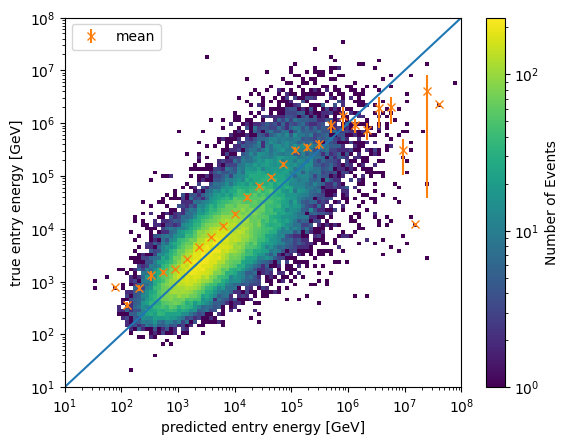

In [19]:
correlation_plot(df_DNN_energy_leading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],df_MCLabelsLeading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],1,8,0)
add_mean_error_entry(df_DNN_energy_leading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],df_MCLabelsLeading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],np.logspace(1,8,100),3)

In [20]:
#prompt_conventional_flux_entry(np.logspace(5,7,10),df_DNN_energy_leading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],df_MCLabelsParent[df_MCLabelsLeading.leading_energy_rel_entry>0.25],CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsLeading.leading_energy_rel_entry>0.25])

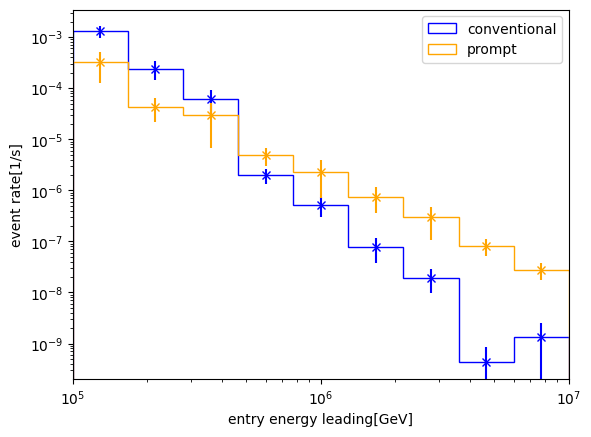

In [21]:
prompt_conventional_flux_entry(np.logspace(5,7,10),df_MCLabelsLeading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],df_MCLabelsParent[df_MCLabelsLeading.leading_energy_rel_entry>0.25],CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsLeading.leading_energy_rel_entry>0.25])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


PearsonRResult(statistic=0.0027634634000519433, pvalue=0.4932153792319764)
SignificanceResult(statistic=0.7667976663238613, pvalue=0.0)


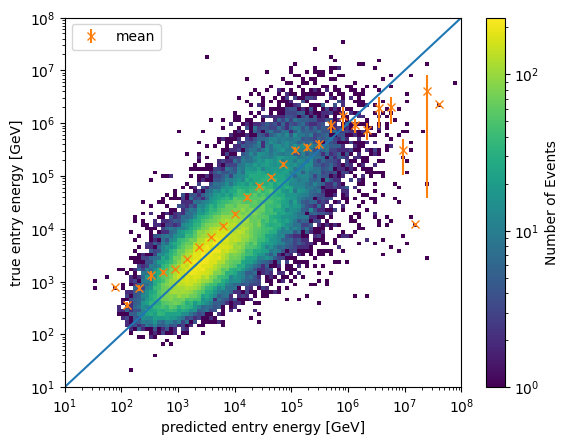

In [22]:
correlation_plot(df_DNN_energy_leading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],df_MCLabelsLeading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],1,8,0)
add_mean_error_entry(df_DNN_energy_leading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],df_MCLabelsLeading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],np.logspace(1,8,100),3)
print(scp.stats.pearsonr(df_DNN_energy_leading.entry_energy[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.25,np.isfinite(df_MCLabelsLeading.entry_energy)],axis=0)],df_MCLabelsLeading.entry_energy[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.25,np.isfinite(df_MCLabelsLeading.entry_energy)],axis=0)]))
print(scp.stats.spearmanr(df_DNN_energy_leading.entry_energy[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.25,np.isfinite(df_MCLabelsLeading.entry_energy)],axis=0)],df_MCLabelsLeading.entry_energy[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.25,np.isfinite(df_MCLabelsLeading.entry_energy)],axis=0)]))

In [23]:
np.max(df_DNN_energy_leading.entry_energy[df_MCLabelsLeading.leading_energy_rel_entry>0.15])
np.max(df_MCLabelsLeading.entry_energy)

37179324.88416861

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


0.5239722252838092
PearsonRResult(statistic=0.0025891747382266973, pvalue=0.2513421705266255)
SignificanceResult(statistic=0.6944306317372826, pvalue=0.0)


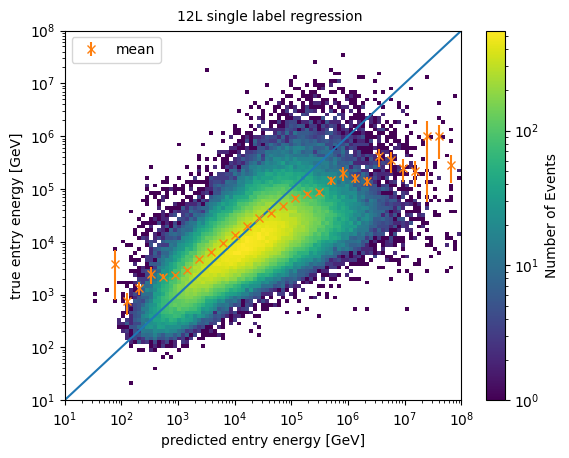

In [24]:
correlation_plot(df_DNN_energy_leading,df_MCLabelsLeading,1,8,0)
add_mean_error_entry(df_DNN_energy_leading,df_MCLabelsLeading,np.logspace(1,8,100),3)
plt.figtext(0.3,0.9,'12L single label regression')
print(np.size(df_DNN_energy_leading.entry_energy[np.all([df_DNN_energy_leading.entry_energy>10**5,df_MCLabelsLeading.entry_energy>10**5],axis=0)])/np.size(df_MCLabelsLeading.entry_energy[df_MCLabelsLeading.entry_energy>10**5]))
print(scp.stats.pearsonr(df_DNN_energy_leading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
print(scp.stats.spearmanr(df_DNN_energy_leading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


SignificanceResult(statistic=0.7006067530245358, pvalue=0.0)


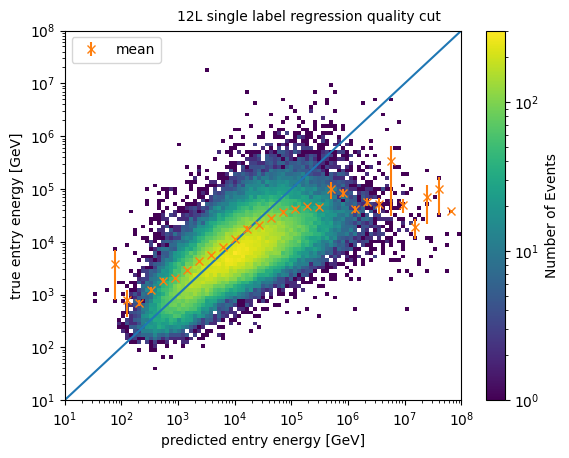

In [25]:
correlation_plot(df_DNN_energy_leading[df_DNN_energy_leading.entry_energy_log_uncertainty<0.3],df_MCLabelsLeading[df_DNN_energy_leading.entry_energy_log_uncertainty<0.3],1,8,0)
add_mean_error_entry(df_DNN_energy_leading[df_DNN_energy_leading.entry_energy_log_uncertainty<0.3],df_MCLabelsLeading[df_DNN_energy_leading.entry_energy_log_uncertainty<0.3],np.logspace(1,8,100),3)
plt.figtext(0.3,0.9,'12L single label regression quality cut')
print(scp.stats.spearmanr(df_DNN_energy_leading.entry_energy[np.all([df_DNN_energy_leading.entry_energy_log_uncertainty<0.3,np.isfinite(df_MCLabelsLeading.entry_energy)],axis=0)],df_MCLabelsLeading.entry_energy[np.all([df_DNN_energy_leading.entry_energy_log_uncertainty<0.3,np.isfinite(df_MCLabelsLeading.entry_energy)],axis=0)]))

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


PearsonRResult(statistic=0.002714032727640327, pvalue=0.4062574130101413)
SignificanceResult(statistic=0.746715756940281, pvalue=0.0)


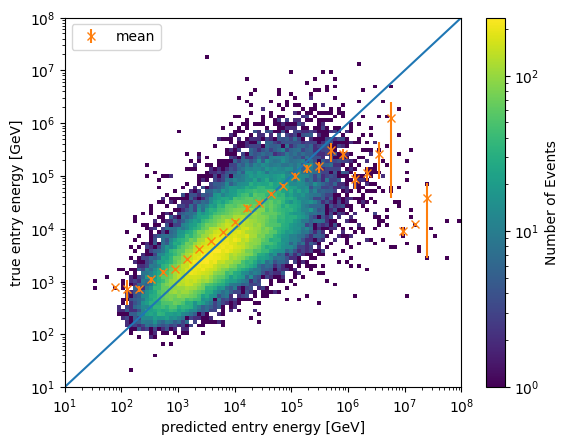

In [26]:
correlation_plot(df_DNN_energy_leading[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.15,df_DNN_energy_leading.entry_energy_log_uncertainty<0.4],axis=0)],df_MCLabelsLeading[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.15,df_DNN_energy_leading.entry_energy_log_uncertainty<0.4],axis=0)],1,8,0)
add_mean_error_entry(df_DNN_energy_leading[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.15,df_DNN_energy_leading.entry_energy_log_uncertainty<0.4],axis=0)],df_MCLabelsLeading[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.15,df_DNN_energy_leading.entry_energy_log_uncertainty<0.4],axis=0)],np.logspace(1,8,100),3)
print(scp.stats.pearsonr(df_DNN_energy_leading.entry_energy[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.15,np.isfinite(df_MCLabelsLeading.entry_energy)],axis=0)],df_MCLabelsLeading.entry_energy[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.15,np.isfinite(df_MCLabelsLeading.entry_energy)],axis=0)]))
print(scp.stats.spearmanr(df_DNN_energy_leading.entry_energy[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.15,np.isfinite(df_MCLabelsLeading.entry_energy)],axis=0)],df_MCLabelsLeading.entry_energy[np.all([df_MCLabelsLeading.leading_energy_rel_entry>0.15,np.isfinite(df_MCLabelsLeading.entry_energy)],axis=0)]))

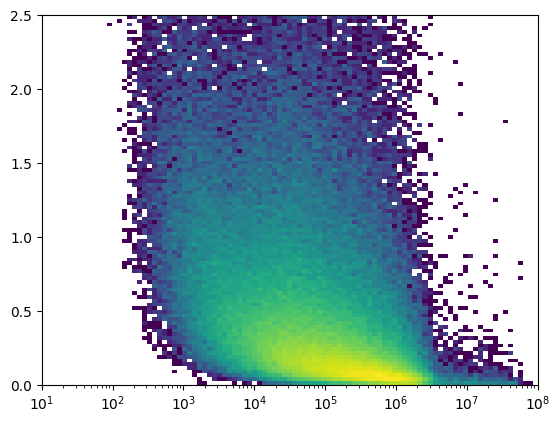

In [27]:
plt.hist2d(df_MCLabelsLeading.bundle_energy_at_entry,df_DNN_energy_leading.entry_energy/df_MCLabelsLeading.bundle_energy_at_entry,bins=[np.logspace(1,8,100),np.linspace(0,2.5,100)],range=[(1,10**8),(0,2.5)],norm='log')
#plt.plot(mid(np.logspace(1,8,100)),mean_rel,'x')
plt.xscale('log')

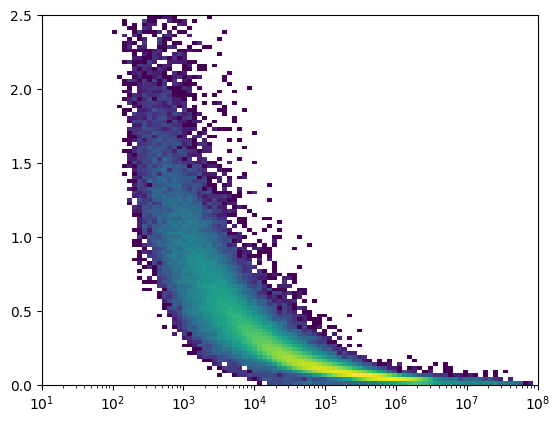

In [28]:
plt.hist2d(df_MCLabelsLeading_c.bundle_energy_at_entry,df_DNN_energy_cleaned.entry_energy/df_MCLabelsLeading_c.bundle_energy_at_entry,bins=[np.logspace(1,8,100),np.linspace(0,2.5,100)],range=[(1,10**8),(0,2.5)],norm='log')
#plt.plot(mid(np.logspace(1,8,100)),mean_rel,'x')
plt.xscale('log')

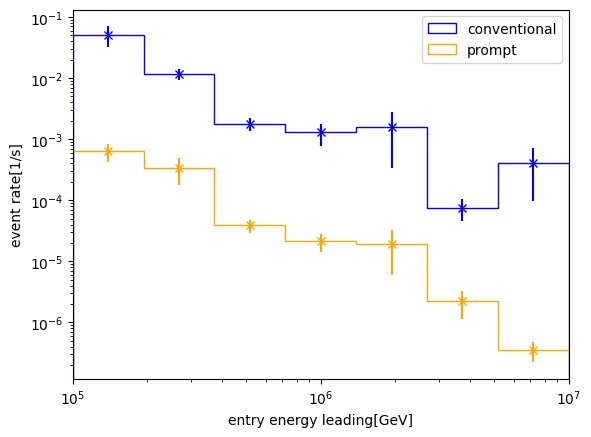

In [29]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_energy_leading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)

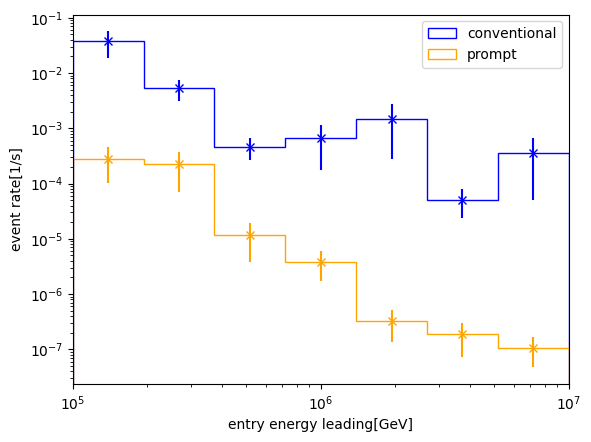

In [30]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_energy_leading[df_MCLabelsLeading.leading_energy_rel_entry>0.25],df_MCLabelsParent[df_MCLabelsLeading.leading_energy_rel_entry>0.25],CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsLeading.leading_energy_rel_entry>0.25])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


0      0.042147
1      0.043621
2      0.059923
3      0.075255
4      0.062222
         ...   
470    0.633318
471    0.124078
472    0.142578
473    0.118770
474    0.118118
Name: leading_energy_rel_entry, Length: 196315, dtype: float64

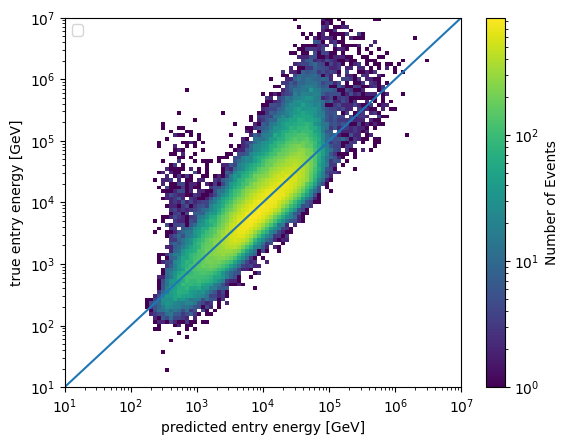

In [31]:
correlation_plot(df_DNN_energy_cleaned,df_MCLabelsLeading_c,1,7,0)
df_DNN_energy_cleaned.leading_energy_rel_entry

(6.309573444801942e-11, 0.0031622776601683794)

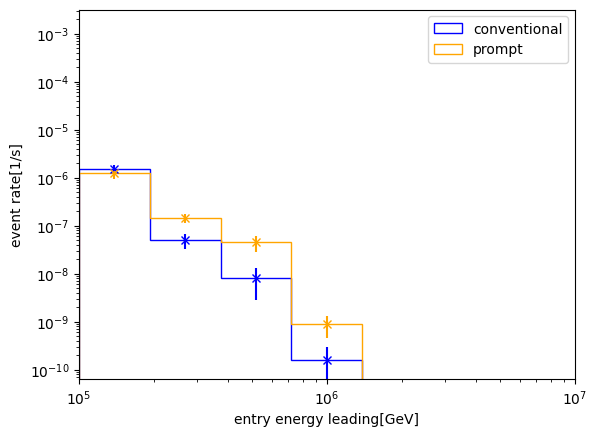

In [32]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_DNN_energy_cleaned,df_MCLabelsParent_c,CorsikaWeightMap_c.simweights_GaisserH3a)
plt.ylim([10**(-10.2),10**(-2.5)])

/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


Text(0, 0.5, 'true leading muon energy [GeV]')

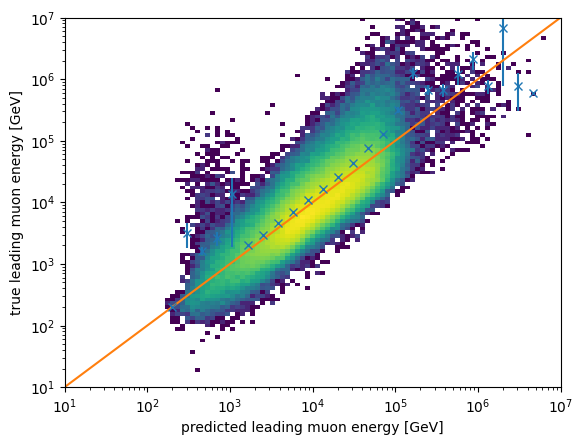

In [33]:
bins_entry=np.logspace(1,7,100)
plt.hist2d(df_DNN_energy_cleaned.bundle_energy_at_entry*df_DNN_energy_cleaned.leading_energy_rel_entry,df_MCLabelsLeading_c.entry_energy,bins=np.logspace(1,7,100),norm='log')
plt.xscale('log')
plt.yscale('log')
sem1, bins2, digitized1=scp.stats.binned_statistic(df_DNN_energy_cleaned.leading_energy_rel_entry*df_DNN_energy_cleaned.bundle_energy_at_entry,df_MCLabelsLeading_c.entry_energy,bins=bins_entry,statistic=nansem)
mean1, bins2, digitized1=scp.stats.binned_statistic(df_DNN_energy_cleaned.leading_energy_rel_entry*df_DNN_energy_cleaned.bundle_energy_at_entry,df_MCLabelsLeading_c.entry_energy,bins=bins_entry,statistic=np.nanmean)
plt.errorbar(mid(bins_entry)[::3],mean1[::3],sem1[::3],fmt='x',label='mean')
plt.plot(bins_entry,bins_entry)
#print(scp.stats.pearsonr(df_DNN_energy_bigger_max.bundle_energy_at_entry[np.isfinite(df_MCLabelsLeading.entry_energy)]*df_DNN_energy_bigger_max.leading_energy_rel_entry[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
#print(scp.stats.spearmanr(df_DNN_energy_bigger_max.bundle_energy_at_entry[np.isfinite(df_MCLabelsLeading.entry_energy)]*df_DNN_energy_bigger_max.leading_energy_rel_entry[np.isfinite(df_MCLabelsLeading.entry_energy)],df_MCLabelsLeading.entry_energy[np.isfinite(df_MCLabelsLeading.entry_energy)]))
#band_90(df_DNN_energy_bigger_max.bundle_energy_at_entry*df_DNN_energy_bigger_max.leading_energy_rel_entry,df_MCLabelsLeading.entry_energy,np.logspace(1,7,100))
plt.xlabel('predicted leading muon energy [GeV]')
plt.ylabel('true leading muon energy [GeV]')
#plt.text(10**5,10**2,'pPearson=0.312')
#plt.text(10**5,10**1.7,'pSpearman=0.846')

In [34]:
cleaned_entry_calc=df_DNN_energy_cleaned.bundle_energy_at_entry*df_DNN_energy_cleaned.leading_energy_rel_entry
np.size(cleaned_entry_calc[np.all([cleaned_entry_calc>10**5,df_MCLabelsLeading_c.entry_energy>10**5],axis=0)])/np.size(df_MCLabelsLeading_c.entry_energy[df_MCLabelsLeading_c.entry_energy>10**5])

0.1472723273207215

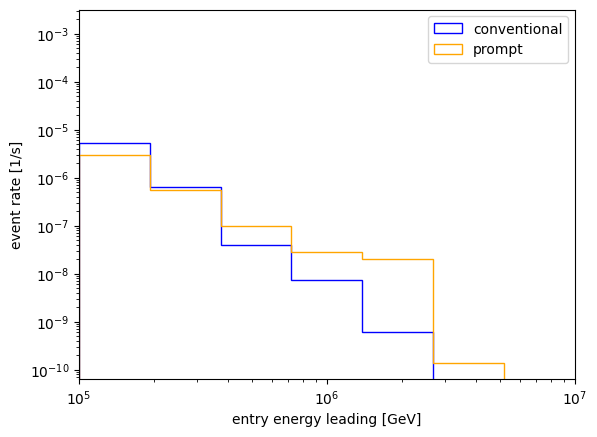

In [35]:
b=np.logspace(5,7,8)
plt.hist(df_DNN_energy_cleaned.bundle_energy_at_entry[df_MCLabelsParent_c.is_prompt_dennis==0]*df_DNN_energy_cleaned.leading_energy_rel_entry[df_MCLabelsParent_c.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=CorsikaWeightMap_c.simweights_GaisserH3a[df_MCLabelsParent_c.is_prompt_dennis==0],color='blue')
plt.hist(df_DNN_energy_cleaned.bundle_energy_at_entry[df_MCLabelsParent_c.is_prompt_dennis==1]*df_DNN_energy_cleaned.leading_energy_rel_entry[df_MCLabelsParent_c.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt',weights=CorsikaWeightMap_c.simweights_GaisserH3a[df_MCLabelsParent_c.is_prompt_dennis==1],color='orange')
plt.xscale('log')
plt.xlim([10**5,10**7])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.xlabel('entry energy leading [GeV]')
plt.ylabel('event rate [1/s]')
plt.legend()
#errors_conventional, error_edges_conventional=bh.numpy.histogram(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0]**2)
#errors_prompt, errors_edges_prompt=bh.numpy.histogram(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=b,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1]**2)
#conventional_weighted, bins_conv=bh.numpy.histogram(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0])
#prompt_weighted, bins_prompt=bh.numpy.histogram(df_DNN_energy_bigger_max.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_energy_bigger_max.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=b, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1])
#mids=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
#plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x',color='blue')
#plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x',color='orange')
#prompt_conventional_flux_entry(np.logspace(5,7,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GlobalFitGST)
#np.size(df_DNN_energy_bigger_max.entry_energy[df_DNN_energy_bigger_max.bundle_energy_at_entry*df_DNN_energy_bigger_max.leading_energy_rel_entry>=10**5])/np.size(df_MCLabelsLeading.entry_energy[df_MCLabelsLeading.entry_energy>=10**5])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


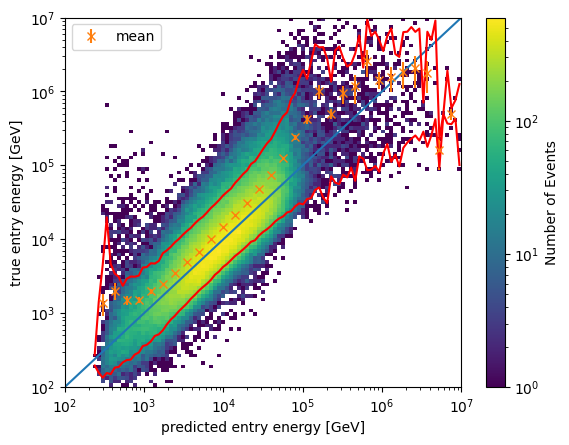

In [36]:
correlation_plot(df_DNN_energy_bigger_max_bias,df_MCLabelsLeading,2,7,0)
add_mean_error_entry(df_DNN_energy_bigger_max_bias,df_MCLabelsLeading,np.logspace(2,7,100),3)
band_90(df_DNN_energy_bigger_max_bias.entry_energy,df_MCLabelsLeading.entry_energy,np.logspace(2,7,100))

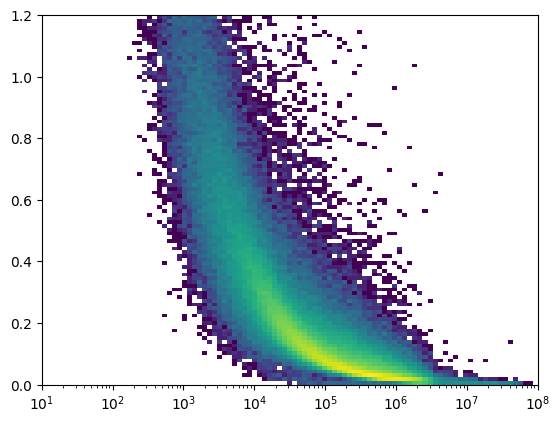

In [37]:
plt.hist2d(df_MCLabelsLeading.bundle_energy_at_entry,df_DNN_energy_s_cleaned.entry_energy/df_MCLabelsLeading.bundle_energy_at_entry,bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)],norm='log')
#plt.plot(mid(np.logspace(1,8,100)),mean_rel,'x')
plt.xscale('log')
#scp.stats.spearmanr(df_DNN_s_cleaned.bundle_energy_at_entry,df_DNN_energy_bigger_conv.leading_energy_rel_entry))

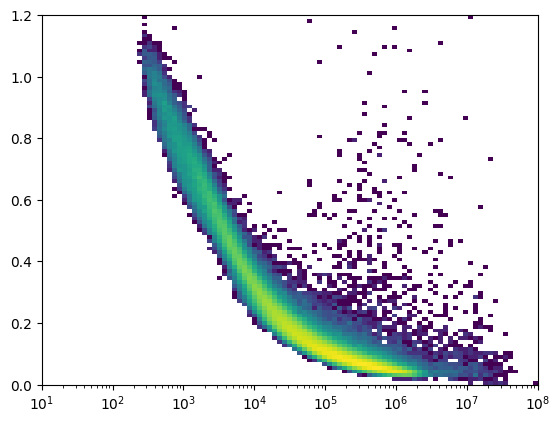

In [38]:
plt.hist2d(df_DNN_energy_bigger_max_bias.bundle_energy_at_entry,df_DNN_energy_bigger_max_bias.entry_energy/df_DNN_energy_bigger_max_bias.bundle_energy_at_entry,bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)],norm='log')
plt.xscale('log')

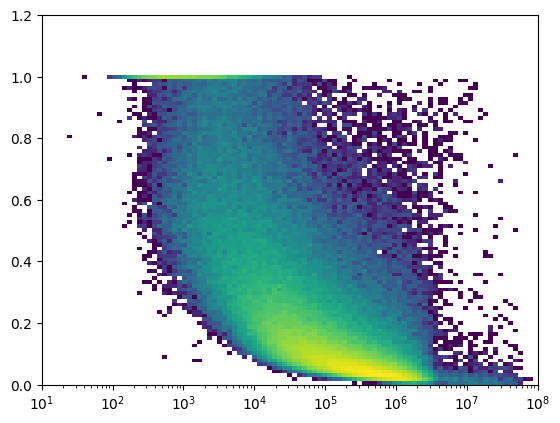

In [39]:
plt.hist2d(df_MCLabelsLeading.bundle_energy_at_entry,df_MCLabelsLeading.leading_energy_rel_entry,bins=[np.logspace(1,8,100),np.linspace(0,1.2,100)],range=[(1,10**8),(0,1.2)],norm='log')
plt.xscale('log')

(1e-11, 0.01)

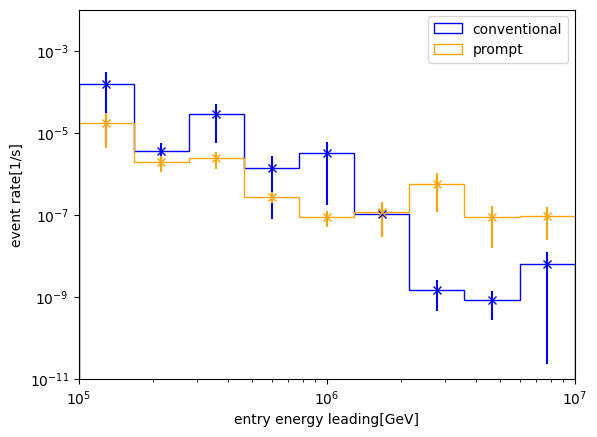

In [40]:
prompt_conventional_flux_entry(np.logspace(5,7,10),df_DNN_energy_bigger_max_bias,df_MCLabelsParent,CorsikaWeightMap.simweights_GlobalSplineFit5Comp)
plt.ylim(10**(-11),10**(-2))

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


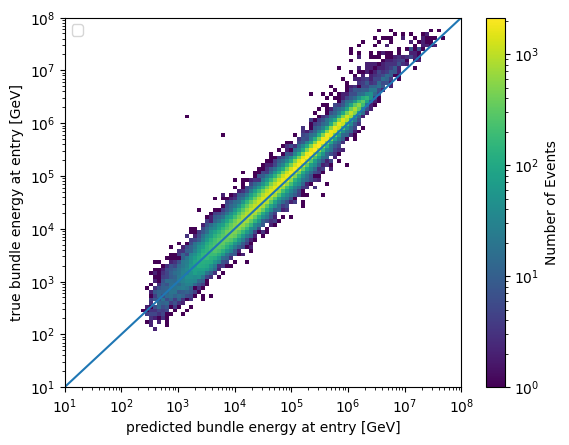

In [41]:
correlation_plot(df_DNN_energy_bigger_max_bias[df_DNN_energy_bigger_max_bias.bundle_energy_at_entry_log_uncertainty<=0.48],df_MCLabelsLeading[df_DNN_energy_bigger_max_bias.bundle_energy_at_entry_log_uncertainty<=0.48],1,8,1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


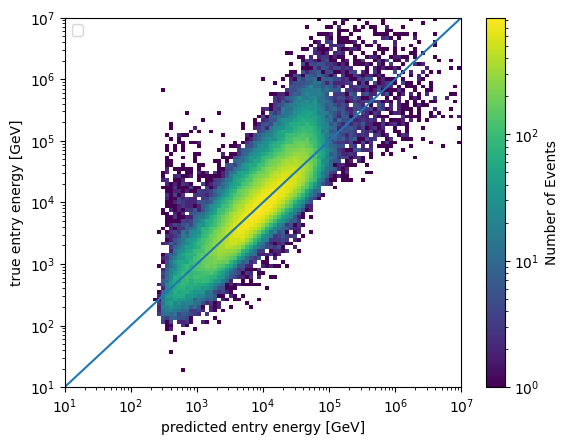

In [42]:
correlation_plot(df_DNN_energy_bigger_max_bias,df_MCLabelsLeading,1,7,0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


PearsonRResult(statistic=0.8685785869627938, pvalue=0.0)

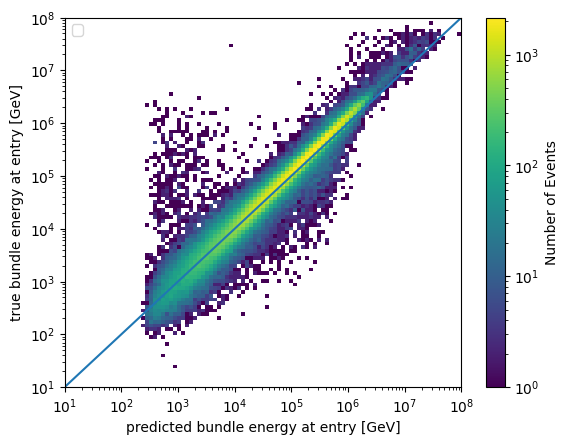

In [43]:
correlation_plot(df_DNN_energy_bigger_max_bias,df_MCLabelsLeading,1,8,1)
scp.stats.pearsonr(df_DNN_energy_bigger_max_bias.bundle_energy_at_entry,df_MCLabelsLeading.bundle_energy_at_entry)

(1e-11, 0.015848931924611134)

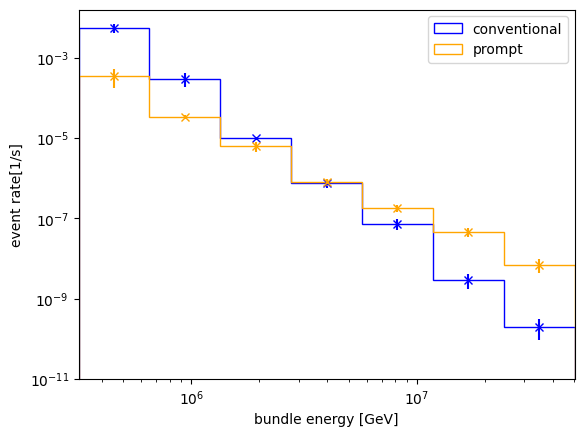

In [44]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_bigger_max_bias,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-11),10**(-1.8)])

(1e-11, 0.015848931924611134)

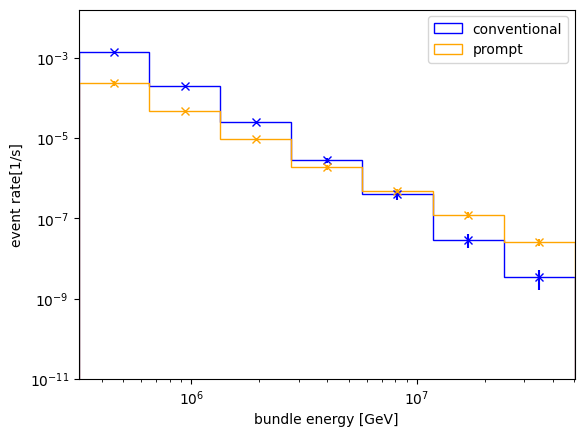

In [45]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-11),10**(-1.8)])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


PearsonRResult(statistic=0.7851299253796112, pvalue=0.0)
SignificanceResult(statistic=0.9807955393825132, pvalue=0.0)


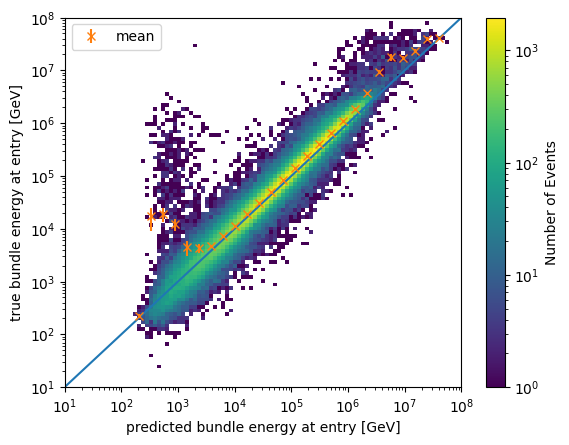

In [46]:
correlation_plot(df_DNN_energy_cleaned,df_MCLabelsLeading_c,1,8,1)
add_mean_error_bundle(df_DNN_energy_cleaned,df_MCLabelsLeading_c,np.logspace(1,8,100),3)
print(scp.stats.pearsonr(df_DNN_energy_cleaned.bundle_energy_at_entry,df_MCLabelsLeading_c.bundle_energy_at_entry))
print(scp.stats.spearmanr(df_DNN_energy_cleaned.bundle_energy_at_entry,df_MCLabelsLeading_c.bundle_energy_at_entry))

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/scratch/lflottau/lf/lib/python3.10/site-packages/numpy/core/_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


PearsonRResult(statistic=0.7851299253796112, pvalue=0.0)
SignificanceResult(statistic=0.9807955393825132, pvalue=0.0)


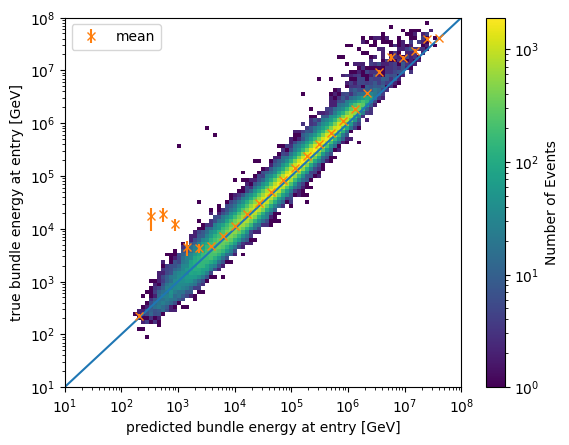

In [47]:
correlation_plot(df_DNN_energy_cleaned[df_DNN_energy_cleaned.bundle_energy_at_entry_log_uncertainty<=0.48],df_MCLabelsLeading_c[df_DNN_energy_cleaned.bundle_energy_at_entry_log_uncertainty<=0.48],1,8,1)
print(scp.stats.pearsonr(df_DNN_energy_cleaned.bundle_energy_at_entry,df_MCLabelsLeading_c.bundle_energy_at_entry))
print(scp.stats.spearmanr(df_DNN_energy_cleaned.bundle_energy_at_entry,df_MCLabelsLeading_c.bundle_energy_at_entry))
add_mean_error_bundle(df_DNN_energy_cleaned,df_MCLabelsLeading_c,np.logspace(1,8,100),3)

(1e-11, 0.015848931924611134)

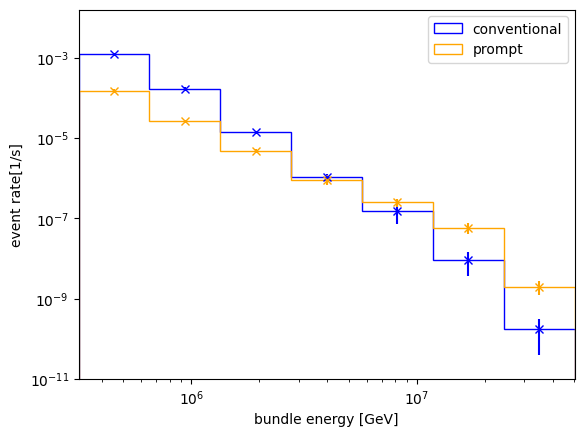

In [48]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_cleaned,df_MCLabelsParent_c,CorsikaWeightMap_c.simweights_GaisserH3a)
plt.ylim([10**(-11),10**(-1.8)])

In [49]:
print(scp.stats.spearmanr(df_DNN_energy_cleaned.entry_energy[np.isfinite(df_MCLabelsLeading_c.entry_energy)],df_MCLabelsLeading_c.entry_energy[np.isfinite(df_MCLabelsLeading_c.entry_energy)]))
print(scp.stats.pearsonr(df_DNN_energy_cleaned.entry_energy[np.isfinite(df_MCLabelsLeading_c.entry_energy)],df_MCLabelsLeading_c.entry_energy[np.isfinite(df_MCLabelsLeading_c.entry_energy)]))

SignificanceResult(statistic=0.8433226953487934, pvalue=0.0)
PearsonRResult(statistic=0.325823597159225, pvalue=0.0)


(1e-11, 0.015848931924611134)

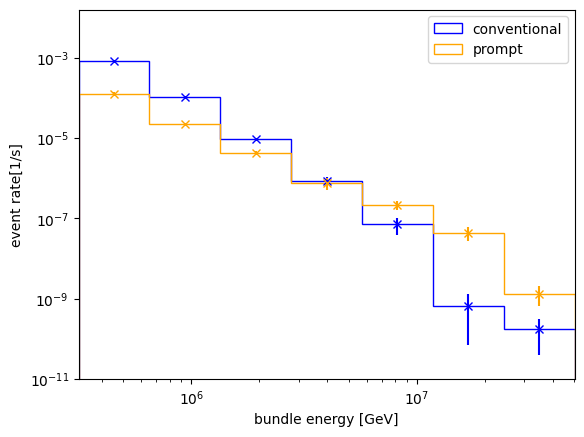

In [50]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_cleaned[df_DNN_energy_cleaned.bundle_energy_at_entry_log_uncertainty<=0.48],df_MCLabelsParent_c[df_DNN_energy_cleaned.bundle_energy_at_entry_log_uncertainty<=0.48],CorsikaWeightMap_c.simweights_GaisserH3a[df_DNN_energy_cleaned.bundle_energy_at_entry_log_uncertainty<=0.48])
plt.ylim([10**(-11),10**(-1.8)])

(1e-11, 0.015848931924611134)

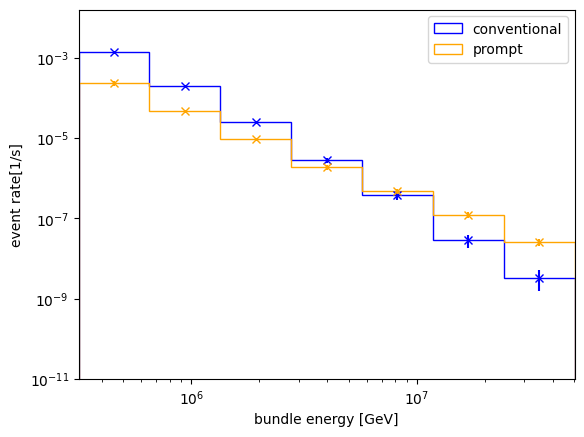

In [51]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_MCLabelsLeading_c,df_MCLabelsParent_c,CorsikaWeightMap_c.simweights_GaisserH3a)
plt.ylim([10**(-11),10**(-1.8)])

(1e-11, 0.015848931924611134)

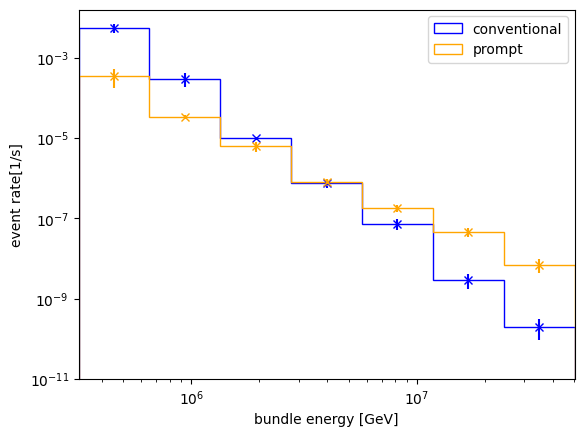

In [52]:
prompt_conventional_flux_bundle(np.logspace(5.5,7.7,8),df_DNN_energy_bigger_max_bias,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.ylim([10**(-11),10**(-1.8)])

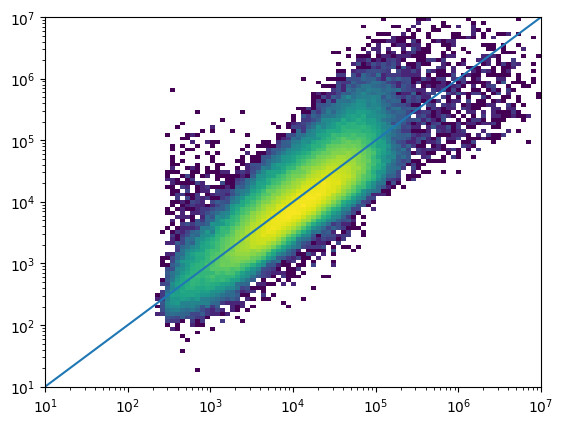

In [53]:
bigger_max_entry_energy_calc=df_DNN_energy_bigger_max_bias.bundle_energy_at_entry*df_DNN_energy_bigger_max_bias.leading_energy_rel_entry
plt.hist2d(bigger_max_entry_energy_calc,df_MCLabelsLeading.entry_energy,norm='log',bins=np.logspace(1,7,100))
plt.xscale('log')
plt.yscale('log')
plt.plot(np.logspace(1,7,100),np.logspace(1,7,100))

0.25504243359418055


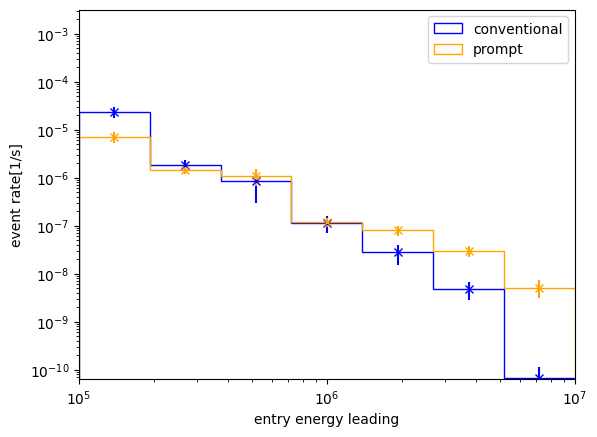

In [54]:
b=np.logspace(5,7,8)
plt.hist(df_DNN_energy_bigger_max_bias.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_energy_bigger_max_bias.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b,histtype='step', log=True, label='conventional', weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0],color='blue')
plt.hist(df_DNN_energy_bigger_max_bias.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_energy_bigger_max_bias.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1], bins=b, histtype='step',log=True,label='prompt',weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1],color='orange')
plt.xscale('log')
plt.xlim([10**5,10**7])
plt.ylim([10**(-10.2),10**(-2.5)])
plt.xlabel('entry energy leading')
plt.ylabel('event rate[1/s]')
plt.legend()
errors_conventional, error_edges_conventional=bh.numpy.histogram(df_DNN_energy_bigger_max_bias.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_energy_bigger_max_bias.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0]**2)
errors_prompt, errors_edges_prompt=bh.numpy.histogram(df_DNN_energy_bigger_max_bias.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_energy_bigger_max_bias.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=b,weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1]**2)
conventional_weighted, bins_conv=bh.numpy.histogram(df_DNN_energy_bigger_max_bias.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==0]*df_DNN_energy_bigger_max_bias.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==0],bins=b, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==0])
prompt_weighted, bins_prompt=bh.numpy.histogram(df_DNN_energy_bigger_max_bias.bundle_energy_at_entry[df_MCLabelsParent.is_prompt_dennis==1]*df_DNN_energy_bigger_max_bias.leading_energy_rel_entry[df_MCLabelsParent.is_prompt_dennis==1],bins=b, weights=CorsikaWeightMap.simweights_GaisserH3a[df_MCLabelsParent.is_prompt_dennis==1])
mids=10**(np.log10(b)[:(np.size(b)-1)]+np.diff(np.log10(b))/2)
plt.errorbar(mids,conventional_weighted,yerr=np.sqrt(errors_conventional),fmt='x',color='blue')
plt.errorbar(mids,prompt_weighted,yerr=np.sqrt(errors_prompt),fmt='x',color='orange')
print(np.size(bigger_max_entry_energy_calc[np.all([bigger_max_entry_energy_calc>10**5,df_MCLabelsLeading.entry_energy>10**5],axis=0)])/np.size(df_MCLabelsLeading.entry_energy[df_MCLabelsLeading.entry_energy>10**5]))

(100000, 10000000)

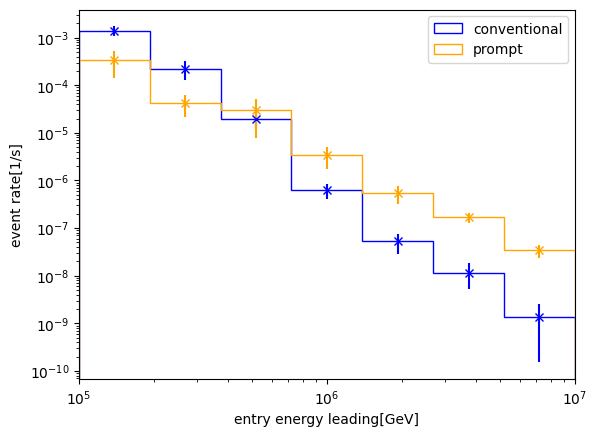

In [55]:
prompt_conventional_flux_entry(np.logspace(5,7,8),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)
plt.xlim([10**5,10**7])

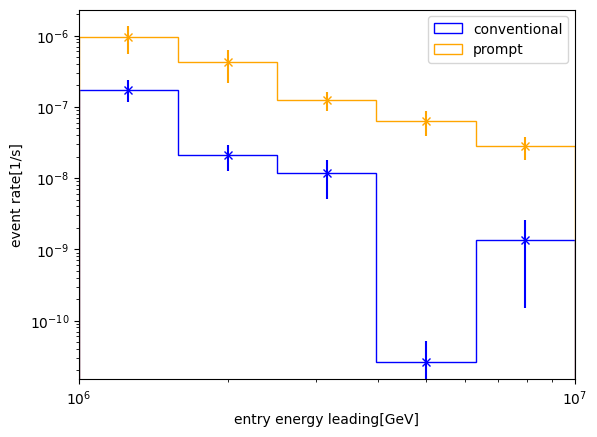

In [56]:
prompt_conventional_flux_entry(np.logspace(6,7,6),df_MCLabelsLeading,df_MCLabelsParent,CorsikaWeightMap.simweights_GaisserH3a)

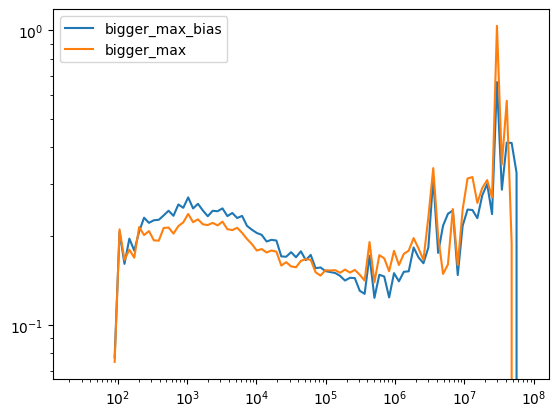

In [57]:
bundle_resolution_bigger_max_bias,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.bundle_energy_at_entry,np.log10(df_DNN_energy_bigger_max_bias.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
plt.plot(mid(np.logspace(1,8,100)),bundle_resolution_bigger_max_bias,label='bigger_max_bias')
bundle_resolution_bigger_max,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading2.bundle_energy_at_entry,np.log10(df_DNN_energy_bigger_max.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
plt.plot(mid(np.logspace(1,8,100)),bundle_resolution_bigger_max,label='bigger_max')
plt.xscale('log')
plt.yscale('log')
plt.legend()

(0.1, 1.9952623149688795)

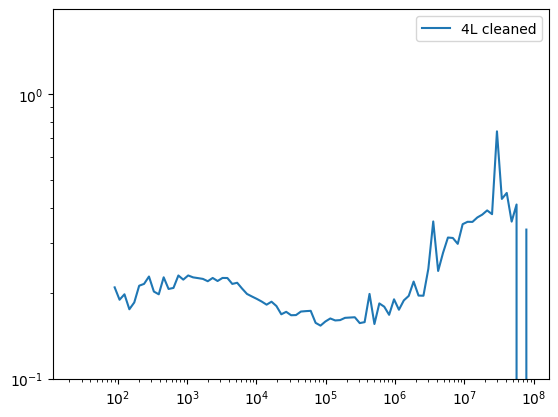

In [58]:
bundle_resolution_cleaned,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading_c.bundle_energy_at_entry,np.log10(df_DNN_energy_cleaned.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
plt.plot(mid(np.logspace(1,8,100)),bundle_resolution_cleaned,label='4L cleaned')
#bundle_resolution_bigger_max,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading2.bundle_energy_at_entry,np.log10(df_DNN_energy_bigger_max.bundle_energy_at_entry),bins=np.logspace(1,8,100),statistic=np.nanstd)
#plt.plot(mid(np.logspace(1,8,100)),bundle_resolution_bigger_max,label='bigger_max')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.ylim([10**(-1),10**(0.3)])

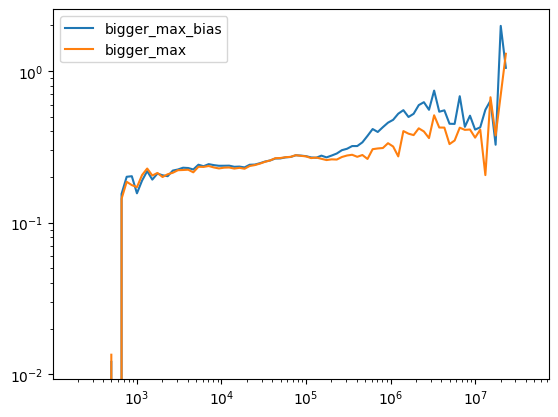

In [59]:
entry_resolution_bigger_max_bias,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading.entry_energy,np.log10(df_DNN_energy_bigger_max_bias.entry_energy),bins=np.logspace(1,8,100),statistic=np.nanstd)
plt.plot(mid(np.logspace(2,8,100)),entry_resolution_bigger_max_bias,label='bigger_max_bias')
entry_resolution_bigger_max,bins,digitized=scp.stats.binned_statistic(df_MCLabelsLeading2.entry_energy,np.log10(df_DNN_energy_bigger_max.entry_energy),bins=np.logspace(1,8,100),statistic=np.nanstd)
plt.plot(mid(np.logspace(2,8,100)),entry_resolution_bigger_max,label='bigger_max')
plt.xscale('log')
plt.yscale('log')
plt.legend()

[0.95643865 0.97045589 0.96751341 0.94204818 0.9426545  0.93161287
 0.92784852 0.91560584 0.8987853  0.89616877 0.87485464 0.87057565
 0.86588892 0.861315   0.85430401 0.85442345 0.85045591 0.84532066
 0.84204609 0.8396525  0.83853374 0.83204323 0.82450719 0.82182707
 0.82158855 0.81381483 0.81191249 0.81181379 0.81213144 0.81184072
 0.81117175 0.80807507 0.80949033 0.8071001  0.8058806  0.80452178
 0.80122945 0.80117545 0.80016795 0.7995106  0.79945044 0.7995269
 0.80074432 0.79857656 0.79849362 0.79570594 0.79567644 0.79282121
 0.79189699 0.79120639 0.79095893 0.7909352  0.79093    0.78627243
 0.7862682  0.78625037 0.78624627 0.78622603 0.78620647 0.78636796]


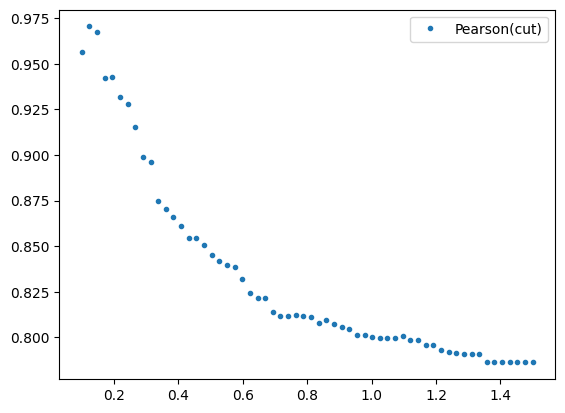

In [60]:
c=np.linspace(0.1,1.5,60)
cp=np.array([])
cfraction=np.array([])
for i in range(np.size(c)):
    c_pred=df_DNN_energy_cleaned[df_DNN_energy_cleaned.bundle_energy_at_entry_log_uncertainty<=c[i]]
    c_true=df_MCLabelsLeading_c[df_DNN_energy_cleaned.bundle_energy_at_entry_log_uncertainty<=c[i]]
    c_Parent=df_MCLabelsParent_c[df_DNN_energy_cleaned.bundle_energy_at_entry_log_uncertainty<=c[i]]
    c_weight=CorsikaWeightMap_c[df_DNN_energy_cleaned.bundle_energy_at_entry_log_uncertainty<=c[i]]
    cp=np.append(cp,np.corrcoef(c_pred.bundle_energy_at_entry,c_true.bundle_energy_at_entry)[0,1])
    cfraction=np.append(cfraction, np.size(c_true.entry_energy)/np.size(df_MCLabelsLeading.entry_energy))
#plt.plot(cfraction,cp,'.')
plt.plot(c,cp,'.',label='Pearson(cut)')
print(cp)
plt.legend()

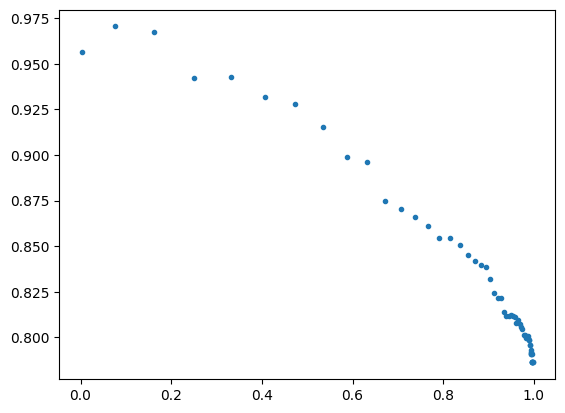

In [61]:
plt.plot(cfraction,cp,'.')

In [62]:
np.size(df_MCLabelsLeading.muon_stochasticity[np.isnan(df_MCLabelsLeading.muon_stochasticity)])/np.size(df_MCLabelsLeading.muon_stochasticity)

1.0

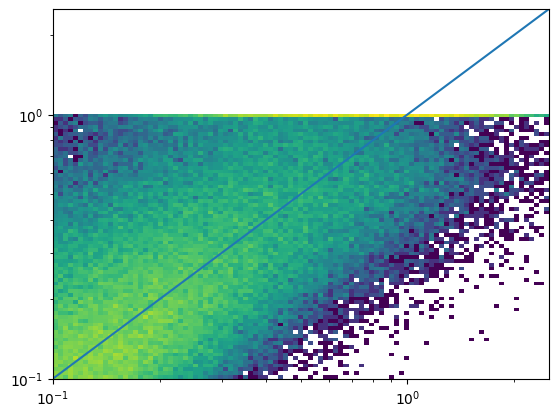

In [63]:
plt.hist2d(df_DNN_energy_cleaned.entry_energy/df_MCLabelsLeading_c.bundle_energy_at_entry,df_MCLabelsLeading_c.leading_energy_rel_entry,bins=np.logspace(-1,0.4,100),range=[[0,2.5],[0,2.5]],norm='log')
plt.plot(np.linspace(0,2.5),np.linspace(0,2.5))
plt.xscale('log')
plt.yscale('log')

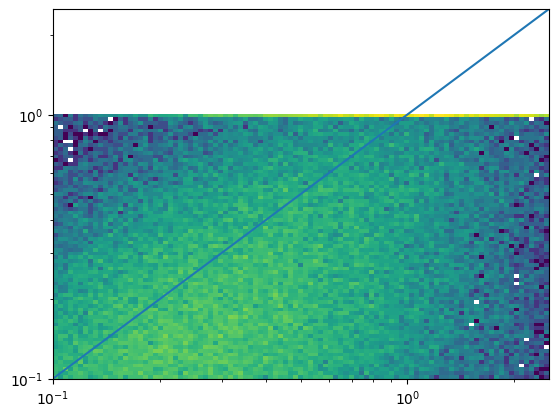

In [64]:
plt.hist2d(df_DNN_energy_leading.entry_energy/df_MCLabelsLeading.bundle_energy_at_entry,df_MCLabelsLeading.leading_energy_rel_entry,bins=np.logspace(-1,0.4,100),range=[[0,2.5],[0,2.5]],norm='log')
plt.plot(np.linspace(0,2.5),np.linspace(0,2.5))
plt.xscale('log')
plt.yscale('log')